In [396]:
import numpy as np
from PIL import Image, ImageFilter, ImageMath, ImageOps
import time
import matplotlib.pyplot as plt

# Open image

In [445]:
im = Image.open("img5.jpg")
im.size

(1800, 1194)

In [446]:
#im = im.resize((1364,1024)).crop((200,0,1224,1024)).rotate(-90)
im = im.resize((1536,1024)).crop((200,0,1224,1024))
im.size

(1024, 1024)

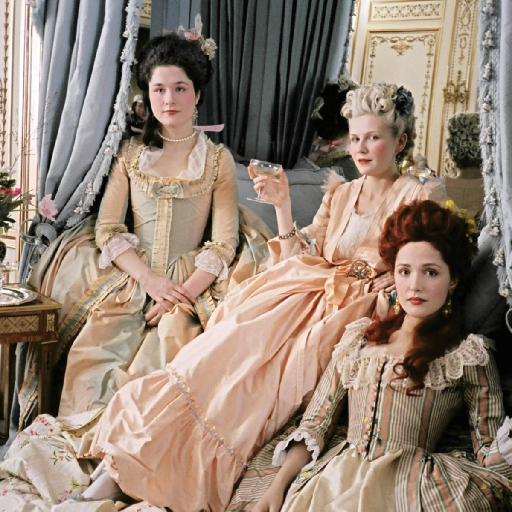

In [447]:
im.resize((512,512))

# Deteriorate

## Black n White

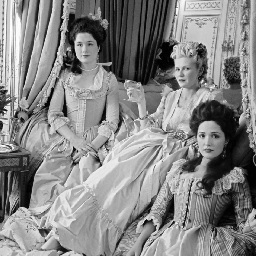

In [448]:
im2 = im.convert("L").resize((256,256))
im2 = ImageOps.autocontrast(im2)
im2

## Gaussian blur

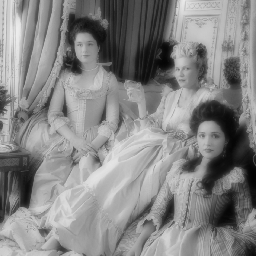

In [449]:
radius = 3 #2 -> 8
alpha = 0.6 #0.2 -> 0.8
im3 = Image.blend(im2, im2.filter(ImageFilter.GaussianBlur(radius)), alpha)
im3

## Contrasts

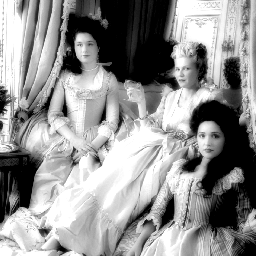

In [450]:
scale = 2 #0.5 -> 2
offset = -0.5 #-0.5 -> 0.5
im4 = im3.copy()
im4.putdata(im3.getdata(), scale, 255*offset)
im4

## Speckle noise

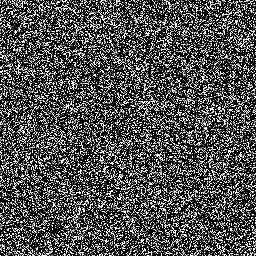

In [451]:
gauss = Image.new("L", (256,256))
gauss.putdata(np.random.randn(256*256)*255)

gauss

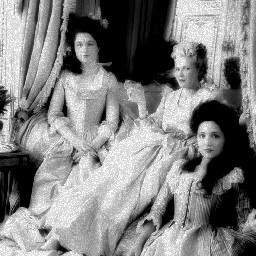

In [452]:
factor = 0.15 #0 -> 0.2
im5 = Image.blend(im4, ImageMath.eval("a*b/255", a=im4, b=gauss).convert("L"), factor)
im5

# Random deterioration

In [460]:
def deterioration(img, index, blurradius=3, bluralpha=0, imgmax=1, imgmin=0, grainalpha=0):    
    out = img.convert("L")
    #out = ImageOps.autocontrast(out)
    out = Image.blend(out, out.filter(ImageFilter.GaussianBlur(blurradius)), bluralpha)
    gauss = Image.open('{:s}/{:06d}.jpg'.format("grains", index))
    out = Image.blend(out, ImageMath.eval("a*b/255", a=out, b=gauss).convert("L"), grainalpha)
    out.putdata(out.getdata(), imgmax-imgmin, 255*imgmin)
    return out

In [461]:
def randomdeterioration(img, index):
    blurradius = int(np.clip(np.random.randn()+3, a_min=0, a_max=10))
    bluralpha = np.clip(np.random.randn()*0.25+0.5, a_min=0, a_max=1)
    imgmin = np.clip(np.random.randn()*0.25+0.5, a_min=0, a_max=1)-0.8
    imgmax = np.clip(np.random.randn()*0.25+0.5, a_min=0, a_max=1)*1.2+0.8
    grainalpha = np.clip(np.random.randn()*0.25+0.5, a_min=0, a_max=1)*0.3
    return deterioration(img, index, blurradius, bluralpha, imgmax, imgmin, grainalpha)

In [462]:
start = time.time()
imgarray = []
for i in range(25):
    imgarray.append(randomdeterioration(im, i))
    
end = time.time()
(end - start)

2.2815048694610596

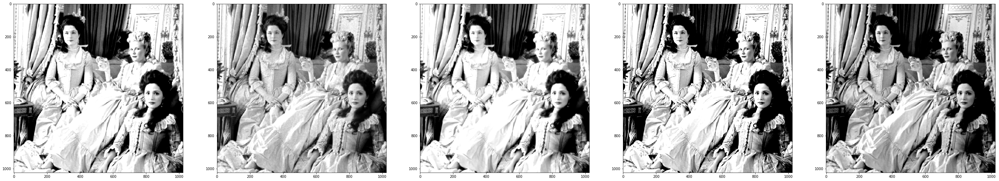

In [463]:
f, axarr = plt.subplots(1, 5, figsize=(50,10))
axarr = axarr.ravel()
for i in range(5):
    axarr[i].imshow(imgarray[i])
plt.show()

# Add mask

In [464]:
start = time.time()
imgmaskarray = []
for i in range(25):
    imgmaskarray.append(imgarray[i])
    if i % 2 == 0:    
        mask = Image.open('{:s}/{:06d}.jpg'.format("masks", i))
        imgmaskarray.append(ImageMath.eval("max(a,b)", a=imgmaskarray[i], b=mask).convert("L"))
    if i % 4 == 0:
        mask2 = Image.open('{:s}/{:06d}.jpg'.format("masks", i+10))
        imgmaskarray[i] = ImageMath.eval("max(a,b)", a=imgmaskarray[i], b=mask2).convert("L")
        
end = time.time()
(end - start)

0.14954495429992676

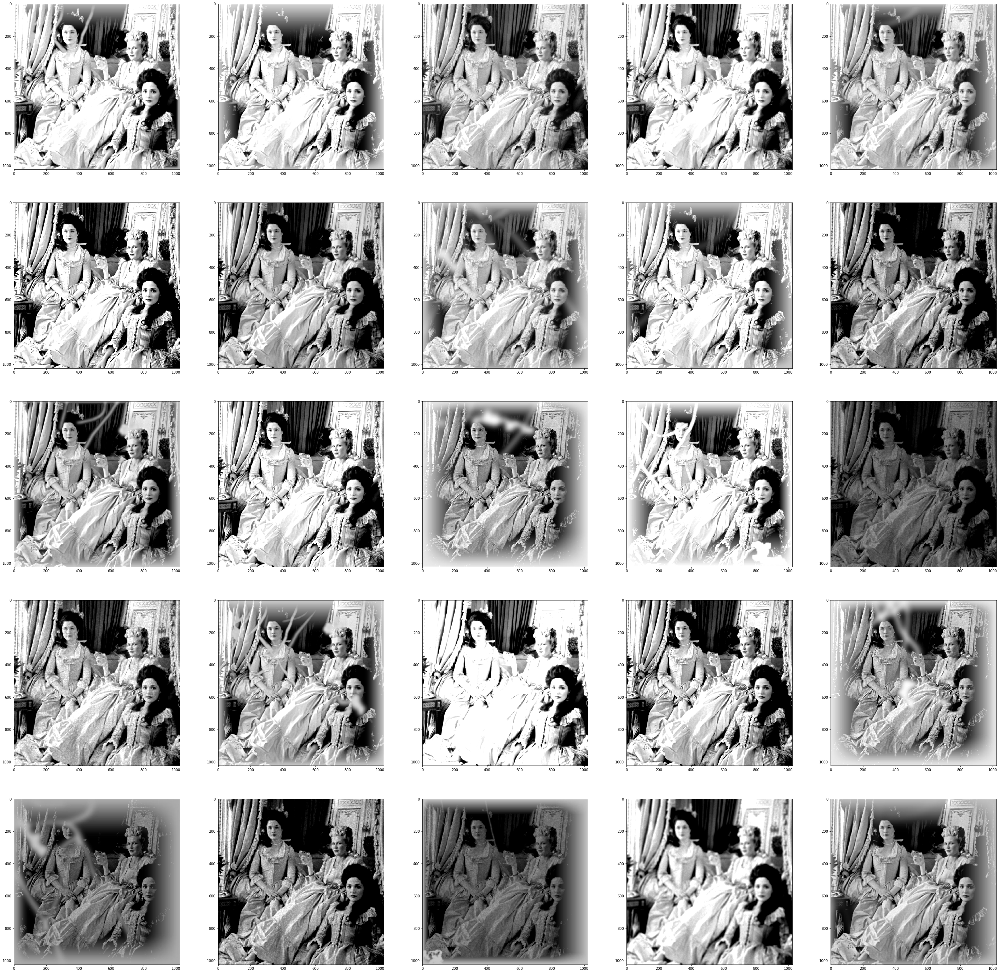

In [465]:
f, axarr = plt.subplots(5, 5, figsize=(50,50))
axarr = axarr.ravel()
for i in range(25):
    axarr[i].imshow(imgmaskarray[i])
plt.show()

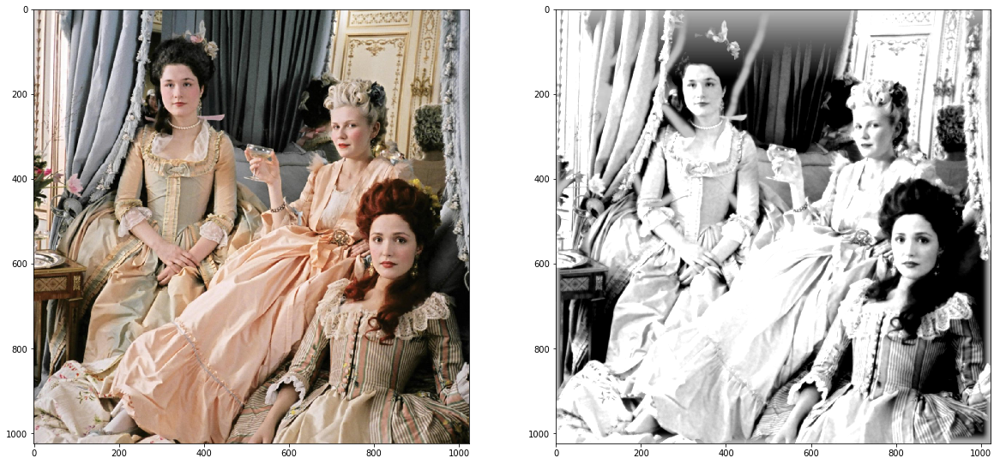

In [467]:
f, axarr = plt.subplots(1, 2, figsize=(20,10))
axarr = axarr.ravel()
axarr[0].imshow(im)
axarr[1].imshow(imgmaskarray[0])
plt.show()